In [93]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
!pip install plotly
import plotly.graph_objects as go

In [94]:
filepath = "map_data.txt"

In [95]:
def is_edge_line(line):
    
    if line.size == 4:
        if '.' not in line[1] and '.' in line[2] and '.' not in line[3]:
            if int(line[3]) != 0:
                return True, True
            return True, False
    
    
    return False, False



# read file that has information on edges and 
with open(filepath, 'r') as f:
    file_lines = f.readlines()

data =  pd.DataFrame([string.replace('\n', '') for string in file_lines]).to_numpy()[:, 0]

skip_next = False
edge_data = []
for i, line in enumerate(data):
    
    if skip_next:
        skip_next = False
        continue
    
    # string to array of strings
    line = np.array(line.split(' '))
    ind = np.where(line != '')
    line = line[ind]
    
    edge_line, skip_next = is_edge_line(line)
    if edge_line:
        if skip_next:
            
            next_line = data[i + 1]
            next_line = np.array(next_line.split(' '))
            ind = np.where(next_line != '')
            next_line = next_line[ind]
            
            # extract
            node_ind = np.arange(0, next_line.size, 2)
            nodes = next_line[node_ind]
            lengths = next_line[1 + node_ind]
            
            # parse
            nodes_parse = []
            lengths_parse = []
            for j, node in enumerate(nodes):
                nodes_parse.append(int(node))
                lengths_parse.append(float(lengths[j]))
            nodes = np.array(nodes_parse)
            lengths = np.array(lengths_parse)
            
            # sort so the closest nodes are in the beggining
            sort_ind = np.argsort(lengths)
            nodes = nodes[sort_ind]
            lengths = lengths[sort_ind]
            
            previous_node = int(line[0])
            for j, next_node in enumerate(nodes):
                l = lengths[j]
                edge = [previous_node, next_node, l]
                edge_data.append(edge)
                previous_node = next_node
            
            edge = [previous_node, int(line[1]), float(line[2])]
            edge_data.append(edge)
            
            continue
            
        # parse edge data
        #edge = [int(line[0]), int(line[1]), float(line[2]), int(line[3])]
        edge = [int(line[0]), int(line[1]), float(line[2])]
        edge_data.append(edge)
            

columns = ['start_node', 'end_node', 'length']
traffic_map = pd.DataFrame(edge_data, columns=columns)
print(traffic_map)

        start_node  end_node    length
0                0         1  0.002025
1                0         6  0.005952
2                1        55  0.004000
3               55        25  0.005371
4               25         2  0.014350
...            ...       ...       ...
109323          40     21045  0.013969
109324       21044        36  0.004151
109325          36        36  0.009917
109326          36     21047  0.009922
109327       21045     21046  0.015084

[109328 rows x 3 columns]


In [96]:
G = nx.from_pandas_edgelist(traffic_map, 'start_node', 'end_node', ['length'])
print(G)

Graph with 21048 nodes and 35514 edges


In [100]:
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        )
    )
)

node_adjacencies = []
node_text = []
for adjacencies in G.adjacency():
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append('# of connections: '+str(len(adjacencies[1])))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=0),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()

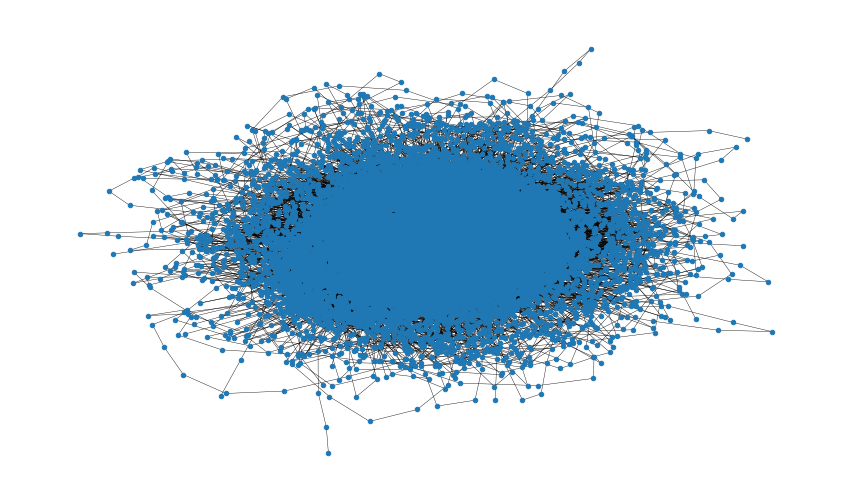

In [98]:
pos = nx.spring_layout(G, iterations=10, seed=1721)
fig, ax = plt.subplots(figsize=(15, 9))
ax.axis("off")
nx.draw_networkx(G, pos=pos, ax=ax, with_labels=False, node_size=20, width=0.4)